#Computer Vision Lab#4
In this problem set you will implement and test some simple stereo algorithms discussed in 
class. In each case you will take two images Il and Ir (a left and a right image) and compute the 
horizontal disparity (ie., shift) of pixels along each scanline. This is the so-called baseline stereo 
case, where the images are taken with a forward-facing camera, and the translation between 
cameras is along the horizontal axis.

#INTRO
 From Wikipedia, the free encyclopedia



Binocular disparity refers to the difference in image location of an object seen by the left and right eyes, resulting from the eyes’ horizontal separation (parallax). The brain uses binocular disparity to extract depth information from the two-dimensional retinal images in stereopsis. In computer vision, binocular disparity refers to the difference in coordinates of similar features within two stereo images.

A similar disparity can be used in rangefinding by a coincidence rangefinder to determine distance and/or altitude to a target. In astronomy, the disparity between different locations on the Earth can be used to determine various celestial parallax, and Earth's orbit can be used for stellar parallax. 

#1 Block Matching
To get the disparity value at each point in the left image, you will search over a range disparities, 
and compare the windows using two different metrics mentioned in class: Sum of Absolute 
Differences (SAD) and Sum of Squared Differences. Do this for windows of size w wwhere 
w = 1, 5 and 9. The disparity, d, is restricted to be in range DdD. For this assignment we will 
use D = 8. You should try at least 2 pairs of images and for each show for each window size 
and each metric disparity image.

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: overflow encountered in ubyte_scalars
  


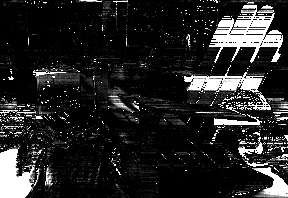

In [0]:
def mse(imageA, imageB):
  map_ = np.zeros(imageA.shape)

  for row in range(imageA.shape[0]):
    for col in range(imageA.shape[1]):
      err = np.min( [(imageA[row][col] - imageB[row][j] )**2 for j in imageB[row] ])
      map_[row][col] = err
  return map_

cv2_imshow(mse(I_left,I_Right))

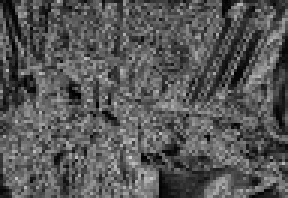

In [0]:
def mse(imageA, imageB,w):
  map_ = np.zeros(imageA.shape)

  for row in range(0,imageA.shape[0],w):
    for col in range(0,imageA.shape[1],w):
      windowA=np.array(imageA[row:row+w,col:col+w])
      windowB=np.array(imageB[row:row+w,col:col+w])
      err = np.average ( [(windowA.reshape(-1) - windowB.reshape(-1) )**2 ])
      map_[row:row+w,col:col+w] = err
  return map_

cv2_imshow(mse(I_left,I_Right,3))

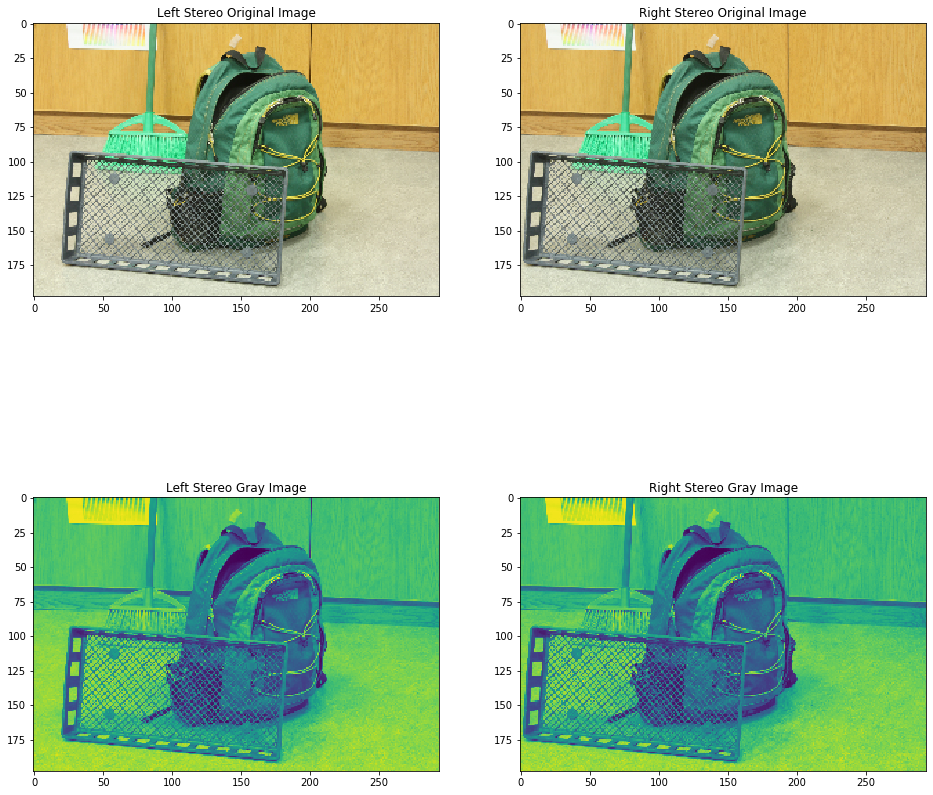

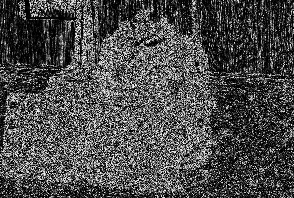

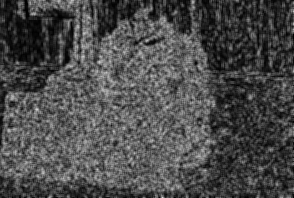

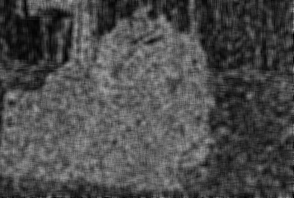

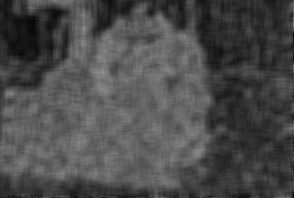

...

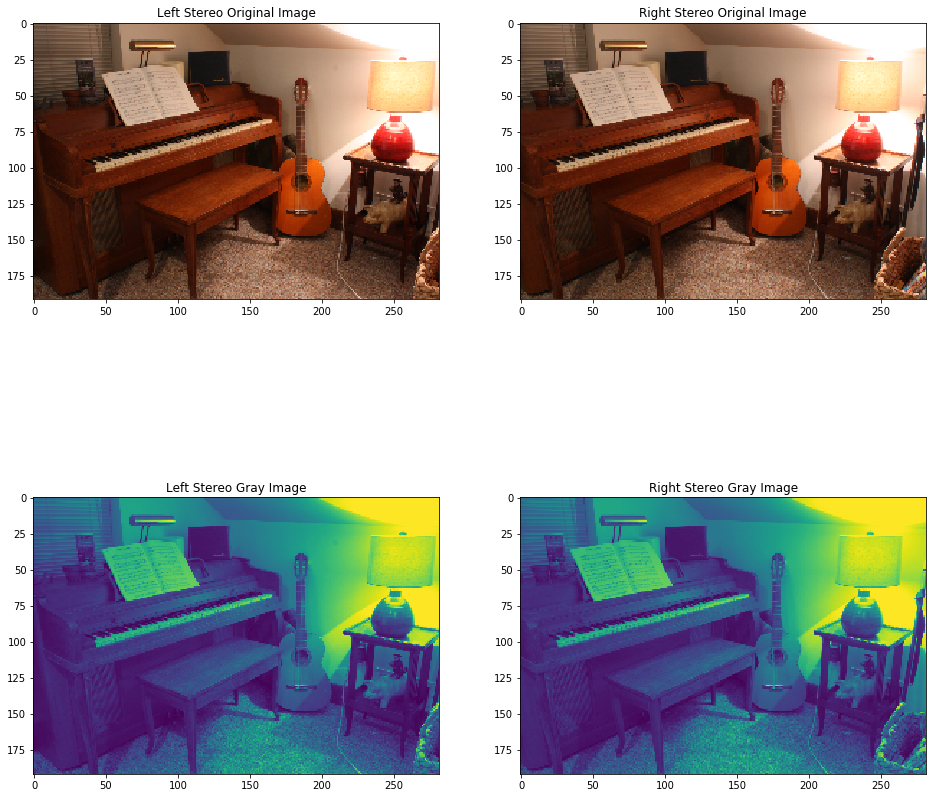

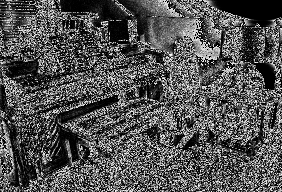

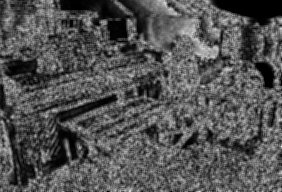

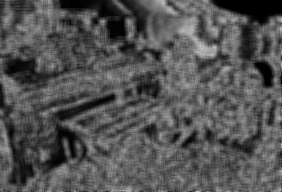

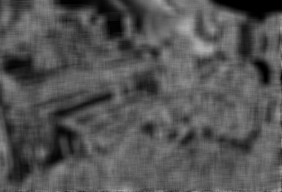

In [0]:
pictures_url = [["http://vision.middlebury.edu/stereo/data/scenes2014/datasets/Backpack-imperfect/im0.png","http://vision.middlebury.edu/stereo/data/scenes2014/datasets/Backpack-imperfect/im1.png"],
                ["http://vision.middlebury.edu/stereo/data/scenes2014/datasets/Bicycle1-imperfect/im0.png","http://vision.middlebury.edu/stereo/data/scenes2014/datasets/Bicycle1-imperfect/im1.png"],
                ["http://vision.middlebury.edu/stereo/data/scenes2014/datasets/Motorcycle-imperfect/im0.png","http://vision.middlebury.edu/stereo/data/scenes2014/datasets/Motorcycle-imperfect/im1.png"],
                ["http://vision.middlebury.edu/stereo/data/scenes2014/datasets/Piano-imperfect/im0.png","http://vision.middlebury.edu/stereo/data/scenes2014/datasets/Piano-imperfect/im1.png"]
                ]
compression_ratio = 10
for left_img_url,right_img_url in pictures_url:
  I_left = io.imread(left_img_url)
  I_left = cv2.resize(I_left,(I_left.shape[1]//compression_ratio,I_left.shape[0]//compression_ratio))
  I_Right = io.imread(right_img_url)
  fig = plt.figure(figsize=(16, 16))
  I_Right = cv2.resize(I_Right,(I_Right.shape[1]//compression_ratio,I_Right.shape[0]//compression_ratio))
  fig.add_subplot(2, 2, 1).set_title("Left Stereo Original Image");plt.imshow(I_left);fig.add_subplot(2, 2, 2).set_title("Right Stereo Original Image");plt.imshow(I_Right)

  # StereoBM works on gray images
  I_left = cv2.cvtColor(I_left, cv2.COLOR_RGB2GRAY)
  fig.add_subplot(2, 2, 3).set_title("Left Stereo Gray Image");plt.imshow(I_left)

  I_Right = cv2.cvtColor(I_Right, cv2.COLOR_RGB2GRAY)
  fig.add_subplot(2, 2, 4).set_title("Right Stereo Gray Image");plt.imshow(I_Right);plt.show()

  cv2_imshow(mse(I_left,I_Right,1))
  cv2_imshow(mse(I_left,I_Right,3))
  cv2_imshow(mse(I_left,I_Right,5))
  cv2_imshow(mse(I_left,I_Right,9))


https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_calib3d/py_depthmap/py_depthmap.html

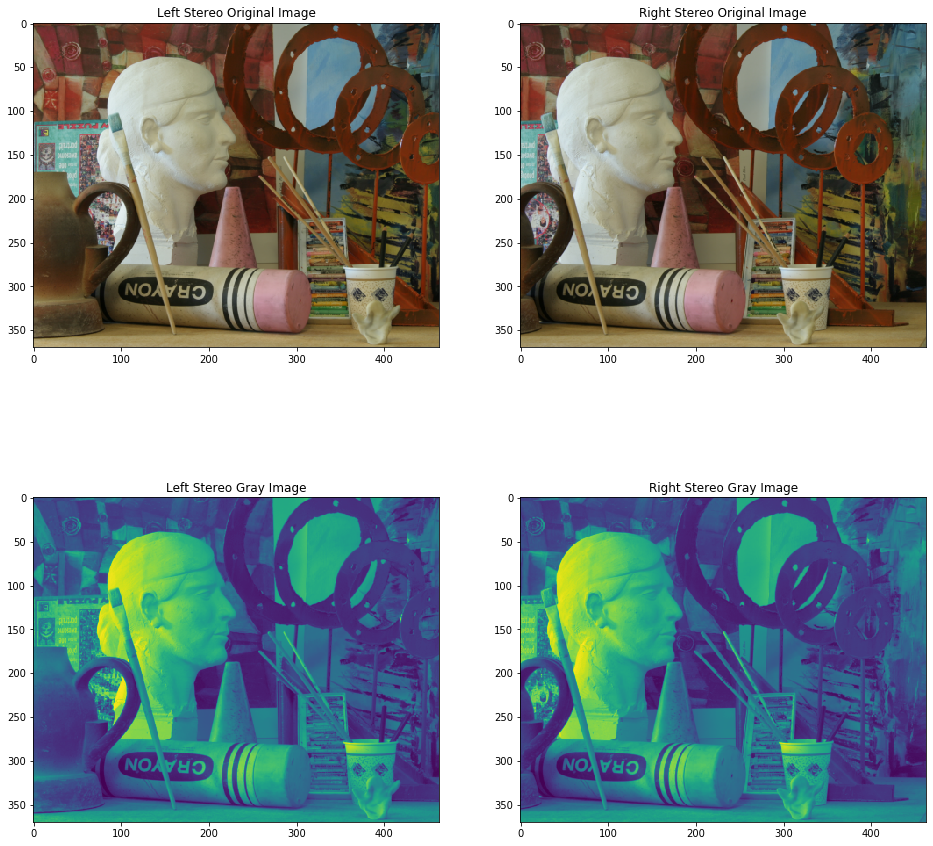

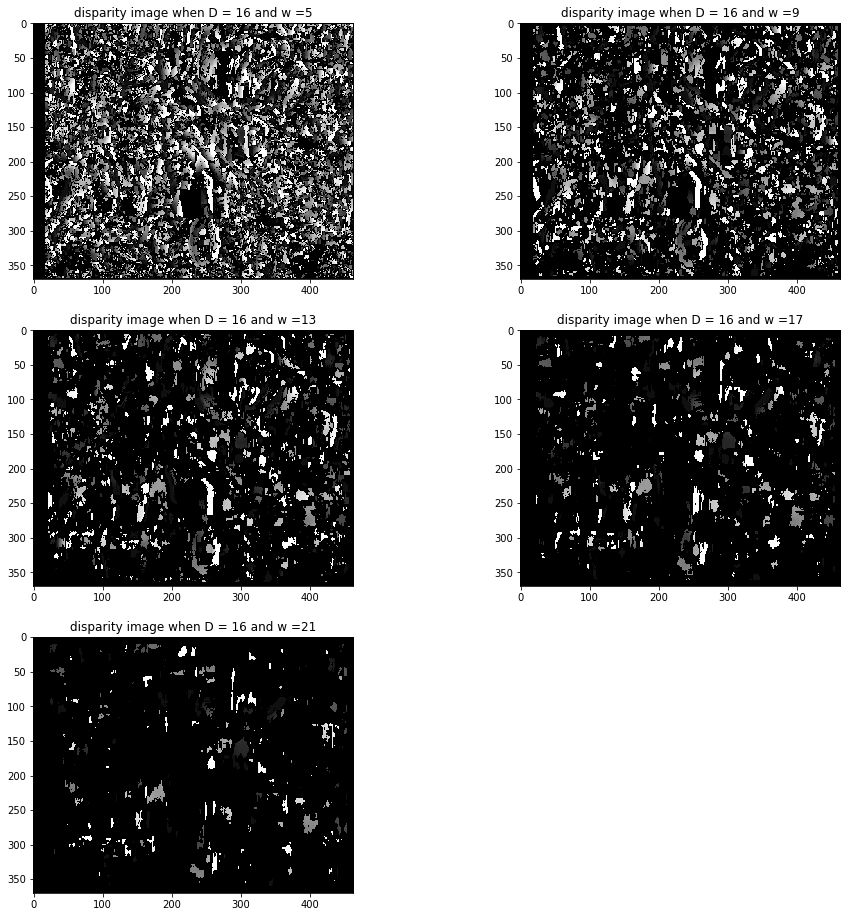

In [0]:
import cv2
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow
import numpy as np
from skimage import io

I_left = io.imread("view1.png",0)
#leftImg = np.asarray(leftImg, dtype=np.uint8) 
I_Right = io.imread("view2.png",0)
#rightImg = np.asarray(rightImg, dtype=np.uint8)

#I_left = io.imread("http://vision.middlebury.edu/stereo/data/scenes2014/datasets/Adirondack-perfect/im0.png")

#I_left = cv2.resize(I_left,(I_left.shape[1]//10,I_left.shape[0]//10),cv2.INTER_AREA)
#I_Right = io.imread("http://vision.middlebury.edu/stereo/data/scenes2014/datasets/Adirondack-perfect/im1.png")
fig = plt.figure(figsize=(16, 16))
#I_Right = cv2.resize(I_Right,(I_Right.shape[1]//10,I_Right.shape[0]//10),cv2.INTER_AREA)
fig.add_subplot(2, 2, 1).set_title("Left Stereo Original Image");plt.imshow(I_left);fig.add_subplot(2, 2, 2).set_title("Right Stereo Original Image");plt.imshow(I_Right)

# StereoBM works on gray images
I_left = cv2.cvtColor(I_left, cv2.COLOR_BGR2GRAY)
fig.add_subplot(2, 2, 3).set_title("Left Stereo Gray Image");plt.imshow(I_left)

I_Right = cv2.cvtColor(I_Right, cv2.COLOR_BGR2GRAY)
fig.add_subplot(2, 2, 4).set_title("Right Stereo Gray Image");plt.imshow(I_Right);plt.show()

# numDisparities must be positive and divisible by 16 in function 'compute'
D = 16
fig = plt.figure(figsize=(16, 16));i=1

for w in range(5,22,4):
  stereo = cv2.StereoBM_create(numDisparities=D, blockSize=w)
# SADWindowSize must be odd, be within 5..255 and be not larger than image width or height in function
  disparity = stereo.compute(I_left,I_Right)
  fig.add_subplot(3, 2, i).set_title("disparity image when D = "+str(D)+" and w ="+str(w));i+=1
  plt.imshow(disparity,'gray')
plt.show()

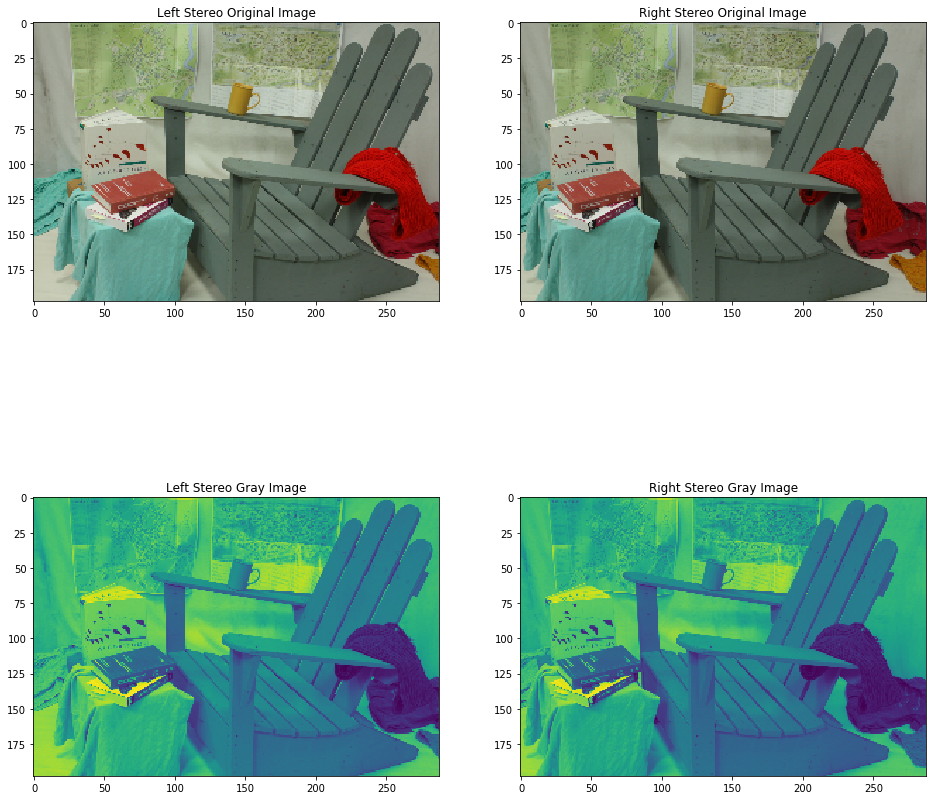

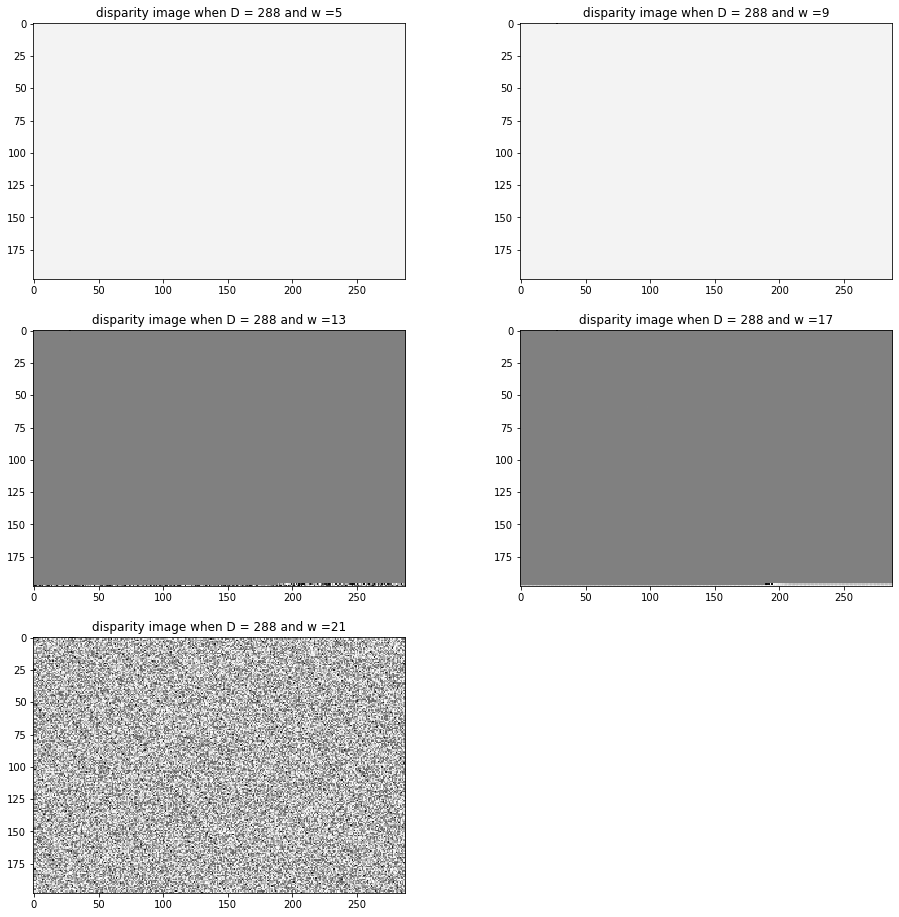

In [0]:
import cv2
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow
import numpy as np
from skimage import io

I_left = io.imread("http://vision.middlebury.edu/stereo/data/scenes2014/datasets/Adirondack-perfect/im0.png")

I_Right = io.imread("http://vision.middlebury.edu/stereo/data/scenes2014/datasets/Adirondack-perfect/im1.png")
fig = plt.figure(figsize=(16, 16))
fig.add_subplot(2, 2, 1).set_title("Left Stereo Original Image");plt.imshow(I_left);fig.add_subplot(2, 2, 2).set_title("Right Stereo Original Image");plt.imshow(I_Right)

# StereoBM works on gray images
I_left = cv2.cvtColor(I_left, cv2.COLOR_BGR2GRAY)
fig.add_subplot(2, 2, 3).set_title("Left Stereo Gray Image");plt.imshow(I_left)

I_Right = cv2.cvtColor(I_Right, cv2.COLOR_BGR2GRAY)
fig.add_subplot(2, 2, 4).set_title("Right Stereo Gray Image");plt.imshow(I_Right);plt.show()

# numDisparities must be positive and divisible by 16 in function 'compute'
D = 18*16
fig = plt.figure(figsize=(16, 16));i=1

for w in range(5,22,4):
  stereo = cv2.StereoBM_create(numDisparities=D, blockSize=w)
# SADWindowSize must be odd, be within 5..255 and be not larger than image width or height in function
  disparity = stereo.compute(I_left,I_Right)
  fig.add_subplot(3, 2, i).set_title("disparity image when D = "+str(D)+" and w ="+str(w));i+=1
  plt.imshow(disparity,'gray')
plt.show()

#2 Dynamic programming

Consider two scanlines Il(i) and Ir(j). Pixels in each scanline may be matched, or skipped 
(considered to be occluded in either the left or right image). Let dij be the cost associated with 
matching pixel Il(i) with pixel Ir(j). Here we consider a squared error measure between pixels 
given by:

dij =  ( (Ir(i)-Il(i))^2 )/σ^2
where σ is some measure of pixel noise. The cost of skipping a pixel (in either scanline) is 
given by a constant c0. For the experiments here we will use σ = 2 and c0 = 1. Given these 
costs, we can compute the optimal (minimal cost) alignment of two scanlines recursively as 
follows:
1. D(1, 1) = d11
2. D(i, j) = min(D(i − 1, j − 1) + dij, D(i − 1, j) + c0, D(i, j − 1) + c0)

The intermediate values are stored in an N-by-N matrix, D. The total cost of matching two 
scanlines is D(N, N). Note that this assumes the lines are matched at both ends (and hence 
have zero disparity there). This is a reasonable approximation provided the images are large 
relative to the disparity shift. Given D we find the optimal alignment by backtracking. In 
particular, starting at (i, j) = (N, N), we choose the minimum value of D from (i-1, j -1),(i - 1, 
j),(i, j - 1). Selecting (i - 1, j) corresponds to skipping a pixel in Il (a unit increase in disparity),
while selecting (i, j - 1) corresponds to skipping a pixel in Ir (a unit decrease in disparity). 
Selecting (i - 1, j - 1) matches pixels (i, j), and therefore leaves disparity unchanged. Beginning 
with zero disparity, we can work backwards from (N, N), tallying the disparity until we reach 
(1, 1).
A good way to interpret your solution is to plot the alignment found for single scan line. 
To display the alignment plot a graph of Il (horizontal) vs Ir (vertical). Begin at D(N, N) and 
work backwards to find the best path. If a pixel in Il is skipped, draw a horizontal line. If a 
pixel in Ir is skipped, draw a vertical line. Otherwise, the pixels are matched, and you draw a 
diagonal line. The plot should end at (1, 1).

In [0]:
σ = 2;c0 = 1

In [0]:
print(I_left.shape)
# print(Il.shape)

(198, 288)


In [0]:
Il = I_left[0,:]
Ir = I_Right[0,:]
# D = np.zeros(shape=(len(Il),len(Il)))
D= np.full((len(Il),len(Ir)), np.inf)

# d11 = (Il[0]-Ir[0])**2/σ**2
#D[0,0] = d11
for i in range(0,len(Il)):
  for j in range(0,len(Ir)):
    dij = ((Il[i]-Ir[j])**2)/σ**2
    if i==0 and j==0:
      D[i,j]=dij
    else:
      # print("------------")
      # print(D[i-1,j-1])
      # print(D[i-1,j])
      # print(D[i,j-1])
      D[i,j] = min(D[i-1,j-1] + dij, D[i-1,j] + c0, D[i,j-1] + c0)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: RuntimeWarning: overflow encountered in ubyte_scalars
  # Remove the CWD from sys.path while we load stuff.


In [0]:
D[-1,-1]

16250.75

In [0]:
D.shape

(288, 288)

In [0]:
theMap = np.zeros(shape=(2880,2))
theMap -=1
print(theMap)

[[-1. -1.]
 [-1. -1.]
 [-1. -1.]
 ...
 [-1. -1.]
 [-1. -1.]
 [-1. -1.]]


In [0]:
disparity =0
j=D.shape[0]-1#2879
i=j
all_points=[]
points=[]
dis=[]
theMap = np.zeros(shape=(D.shape[0]))

#print(theMap)
all_points.append([i,j])
dis.append(disparity)

while i!=0 or j!=0:
  # print("i,j: ",i,j)
  # print("Values : ",D[i - 1, j] ,D[i, j - 1] ,D[i-1, j -1])
  # print("MIN : ",min(D[i - 1, j] ,D[i, j - 1] ,D[i-1, j -1]))
  # print("Disparity: ",disparity)
  # print("---------------------------------")
  if D[i - 1, j] <= D[i, j - 1] and D[i - 1, j] <=  D[i-1, j -1]: # skipping a pixel in Il
    
    theMap[i-1] = j
    disparity+=1
    i-=1
    all_points.append([i,j])
    dis.append(disparity)
    # all_points.append([i,j])

    
  elif D[i, j - 1] <= D[i - 1, j - 1] and D[i, j - 1] <=  D[i - 1, j]: # skipping a pixel in Ir
    theMap[i] = j-1
    disparity-=1
    j-=1
    all_points.append([i,j])
    dis.append(disparity)

    # all_points.append([i,j])

  elif D[i - 1, j - 1] <= D[i, j - 1] and D[i - 1, j - 1] <= D[i - 1, j]:
    # all_points.append([i,j])
    # dis.append(disparity)
    theMap[i-1] = j-1
    i-=1;j-=1
    # all_points.append([i,j])
    all_points.append([i,j])
    dis.append(disparity)
    points.append([i,j])

    


[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


In [0]:
theMap

array([  0.,   4.,   6.,   6.,   7.,   8.,   9.,  10.,  12.,  13.,  13.,
        14.,  14.,  14.,  14.,  14.,  14.,  14.,  14.,  14.,  14.,  15.,
        16.,  17.,  18.,  19.,  20.,  22.,  23.,  24.,  25.,  27.,  27.,
        27.,  27.,  27.,  27.,  27.,  27.,  28.,  29.,  34.,  36.,  37.,
        38.,  43.,  44.,  45.,  45.,  46.,  47.,  48.,  49.,  49.,  49.,
        49.,  49.,  49.,  49.,  50.,  50.,  51.,  52.,  52.,  53.,  53.,
        54.,  55.,  55.,  56.,  68.,  69.,  69.,  69.,  70.,  71.,  72.,
        73.,  74.,  75.,  81.,  83.,  86.,  87.,  88.,  89.,  89.,  89.,
        89.,  89.,  89.,  89.,  89.,  89.,  89.,  89.,  90.,  91.,  92.,
        93.,  94.,  95.,  98., 104., 106., 107., 113., 113., 114., 115.,
       116., 118., 119., 120., 120., 120., 120., 120., 120., 120., 120.,
       120., 120., 120., 121., 122., 123., 124., 125., 133., 135., 136.,
       139., 140., 140., 145., 145., 145., 145., 145., 145., 145., 145.,
       149., 150., 151., 151., 151., 152., 159., 16

In [0]:
points

[[2878, 2878],
 [2874, 2877],
 [2873, 2876],
 [2870, 2875],
 [2868, 2874],
 [2867, 2873],
 [2866, 2872],
 [2865, 2853],
 [2864, 2852],
 [2862, 2849],
 [2861, 2848],
 [2860, 2847],
 [2859, 2844],
 [2858, 2843],
 [2857, 2836],
 [2856, 2833],
 [2855, 2823],
 [2854, 2822],
 [2853, 2821],
 [2849, 2797],
 [2848, 2796],
 [2847, 2791],
 [2846, 2790],
 [2845, 2789],
 [2844, 2788],
 [2843, 2787],
 [2842, 2786],
 [2841, 2785],
 [2839, 2784],
 [2838, 2783],
 [2837, 2782],
 [2836, 2781],
 [2835, 2775],
 [2834, 2774],
 [2833, 2773],
 [2832, 2769],
 [2831, 2764],
 [2830, 2762],
 [2829, 2761],
 [2826, 2760],
 [2825, 2759],
 [2824, 2758],
 [2821, 2757],
 [2819, 2756],
 [2818, 2755],
 [2817, 2754],
 [2816, 2751],
 [2815, 2749],
 [2814, 2746],
 [2813, 2745],
 [2812, 2744],
 [2811, 2743],
 [2810, 2742],
 [2809, 2741],
 [2807, 2738],
 [2805, 2735],
 [2804, 2734],
 [2803, 2732],
 [2798, 2731],
 [2797, 2730],
 [2795, 2728],
 [2794, 2727],
 [2793, 2725],
 [2789, 2724],
 [2788, 2723],
 [2787, 2722],
 [2786, 27

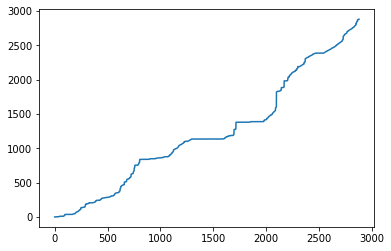

In [0]:
import matplotlib.pyplot as plt
plt.plot(np.array(all_points)[:,0],np.array(all_points)[:,1])


In [0]:
new_d=np.zeros((2880,2880))

In [0]:
counter=0
for i,j in all_points:
  new_d[i,j]=255
  counter+=1


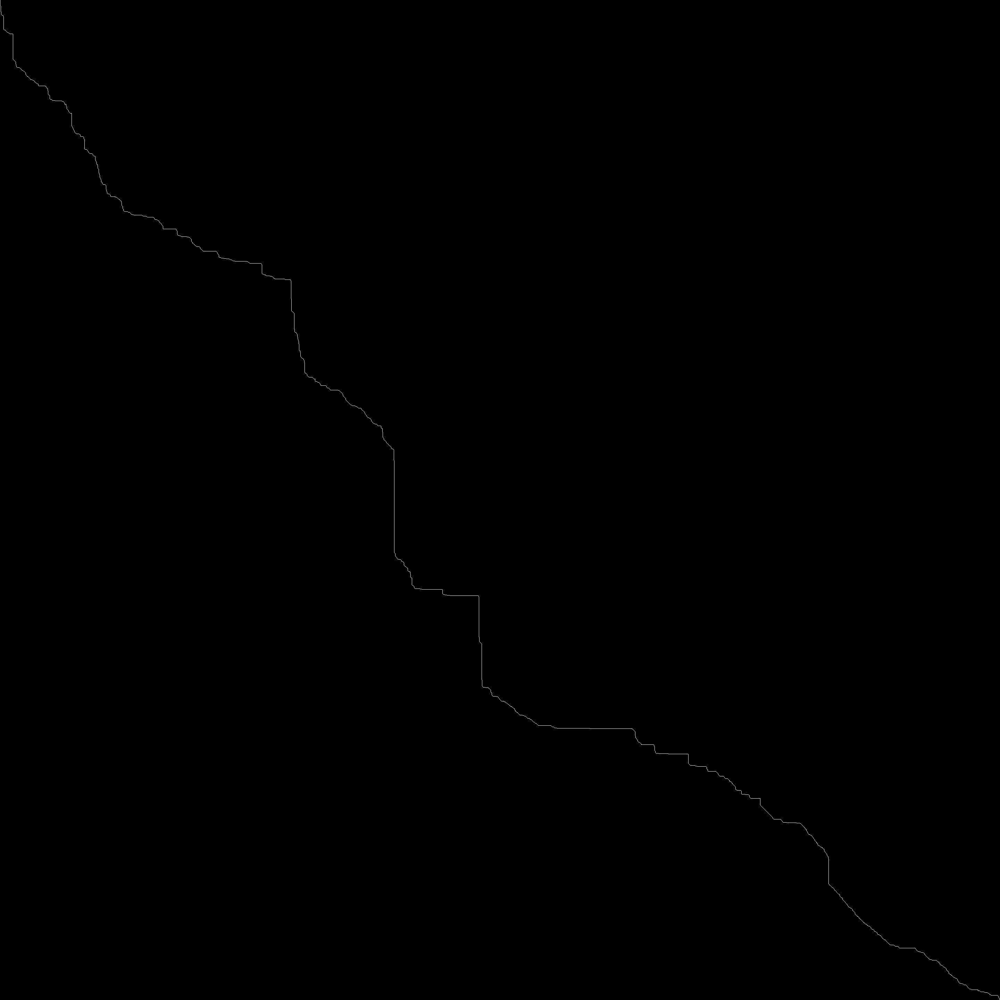

In [0]:
from google.colab.patches import cv2_imshow
cv2_imshow(new_d)

In [0]:
a=np.hstack((np.array(points)[:,1],np.array(dis)))
# k=np.sort(a,order=)

#2.1 Disparity computation
Repeat the process explained above fore each row of the image and compute the disparity maps 
for image pairs.

In [0]:
import cv2
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow
import numpy as np
from skimage import io

I_left = io.imread("view1.png",0)
I_Right = io.imread("view2.png",0)

#leftImg = np.asarray(leftImg, dtype=np.uint8) 
#rightImg = np.asarray(rightImg, dtype=np.uint8)

#I_left = io.imread("http://vision.middlebury.edu/stereo/data/scenes2014/datasets/Adirondack-perfect/im0.png")
#I_left = cv2.resize(I_left,(I_left.shape[1]//10,I_left.shape[0]//10),cv2.INTER_AREA)
#I_Right = io.imread("http://vision.middlebury.edu/stereo/data/scenes2014/datasets/Adirondack-perfect/im1.png")
#I_Right = cv2.resize(I_Right,(I_Right.shape[1]//10,I_Right.shape[0]//10),cv2.INTER_AREA)

#fig.add_subplot(2, 2, 1).set_title("Left Stereo Original Image");plt.imshow(I_left);fig.add_subplot(2, 2, 2).set_title("Right Stereo Original Image");plt.imshow(I_Right)
# StereoBM works on gray images
I_left = cv2.cvtColor(I_left, cv2.COLOR_BGR2GRAY)
#fig.add_subplot(2, 2, 3).set_title("Left Stereo Gray Image");plt.imshow(I_left)

I_Right = cv2.cvtColor(I_Right, cv2.COLOR_BGR2GRAY)
#fig.add_subplot(2, 2, 4).set_title("Right Stereo Gray Image");plt.imshow(I_Right);plt.show()


In [0]:
o=I_left.copy()
o=o.reshape(-1)
o.shape
I_left_test=I_left[0:300]
I_Right_test=I_Right[0:300]

In [0]:
print(I_left_test.shape)

In [0]:
D.shape

(288, 288)

In [0]:
final_disp = []
final_points=[]
leftDisp=np.zeros((I_left.shape[0],I_left.shape[1]))

for k in range(0,I_left.shape[0]):
  print("For row num #",k+1)
  Il = I_left[k,:]
  Ir = I_Right[k,:]
  D= np.full((len(Il),len(Ir)), np.inf)

  for i in range(0,len(Il)):
    for j in range(0,len(Ir)):
      dij = ((Il[i]-Ir[j])**2)/σ**2
      if i==0 and j==0:
        D[i,j]= dij
      else:
        D[i,j] = min(D[i-1,j-1] + dij, D[i-1,j] + c0, D[i,j-1] + c0)
  disparity =0
  i=I_left.shape[1]-1
  j=I_left.shape[1]-1
  points_temp=[]
  dis_temp=[]
  points_temp.append([i,j])
  dis_temp.append(disparity)

  while (i!=0) or  (j!=0):
    #print("i,j: ",i,j)
    # print("Values : ",D[i - 1, j] ,D[i, j - 1] ,D[i-1, j -1])
    # print("MIN : ",min(D[i - 1, j] ,D[i, j - 1] ,D[i-1, j -1]))
    # print("Disparity: ",disparity)
    # print("---------------------------------")
    if D[i - 1, j] <= D[i, j - 1] and D[i - 1, j] <=  D[i-1, j -1]: # skipping a pixel in Il
      leftDisp[k][i]=np.absolute(i-j)+1
      rightDisp[k][i]=0
      disparity+=1
      i-=1
      points_temp.append([i,j])
      dis_temp.append(disparity)

    elif D[i, j - 1] <= D[i - 1, j - 1] and D[i, j - 1] <=  D[i - 1, j]: # skipping a pixel in Ir
      leftDisp[k][j]=np.absolute(i-j)-1
      rightDisp[k][j]=0
      disparity-=1
      j-=1
      points_temp.append([i,j])
      dis_temp.append(disparity)
    elif D[i - 1, j - 1] <= D[i, j - 1] and D[i - 1, j - 1] <= D[i - 1, j]:
      leftDisp[k][i]=np.absolute(i-j)
      rightDisp[k][j]=np.absolute(j-i)
      i-=1;j-=1
      points_temp.append([i,j])
      dis_temp.append(disparity)
  final_disp.append(dis_temp)
  final_points.append(points_temp)
  # print(disparity)
  # print("-----------------")
  # disps.append(disparity)

For row num # 1


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: overflow encountered in ubyte_scalars
  del sys.path[0]


For row num # 2
For row num # 3
For row num # 4
For row num # 5
For row num # 6
For row num # 7
For row num # 8
For row num # 9
For row num # 10
For row num # 11
For row num # 12
For row num # 13
For row num # 14
For row num # 15
For row num # 16
For row num # 17
For row num # 18
For row num # 19
For row num # 20
For row num # 21
For row num # 22
For row num # 23
For row num # 24
For row num # 25
For row num # 26
For row num # 27
For row num # 28
For row num # 29
For row num # 30
For row num # 31
For row num # 32
For row num # 33
For row num # 34
For row num # 35
For row num # 36
For row num # 37
For row num # 38
For row num # 39
For row num # 40
For row num # 41
For row num # 42
For row num # 43
For row num # 44
For row num # 45
For row num # 46
For row num # 47
For row num # 48
For row num # 49
For row num # 50
For row num # 51
For row num # 52
For row num # 53
For row num # 54
For row num # 55
For row num # 56
For row num # 57
For row num # 58
For row num # 59
For row num # 60
For r

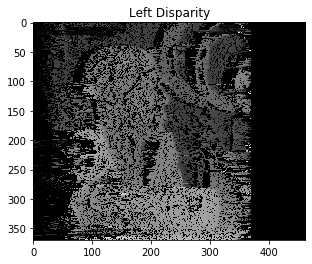

In [0]:
plt.subplot(111),plt.imshow(leftDisp, cmap = 'gray')
plt.title('Left Disparity'), plt.xticks(), plt.yticks()
plt.show()

In [0]:
print(leftDisp)

[[ 0.  0.  1. ...  0.  0.  0.]
 [ 0.  2.  3. ...  0.  0.  0.]
 [ 0.  2.  3. ... 33. 32. 32.]
 ...
 [ 0.  2.  3. ... 50. 38. 38.]
 [ 0.  2.  3. ... 42. 44. 43.]
 [ 0.  2.  3. ... 41. 34. 30.]]


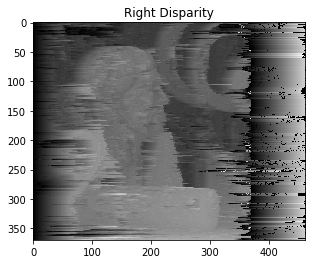

In [0]:
plt.subplot(111),plt.imshow(leftDisp, cmap = 'gray')
plt.title('Right Disparity'), plt.xticks(), plt.yticks()
plt.show()

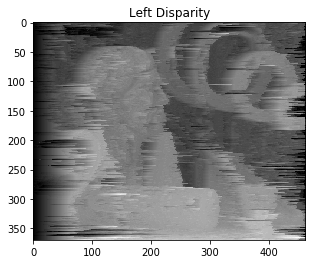

In [0]:
plt.subplot(111),plt.imshow(leftDisp, cmap = 'gray')
plt.title('Left Disparity'), plt.xticks(), plt.yticks()
plt.show()

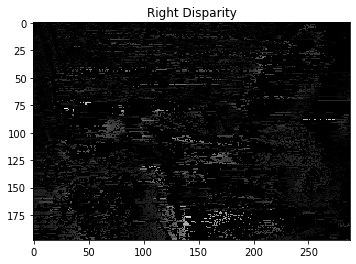

In [0]:
plt.subplot(111),plt.imshow(rightDisp, cmap = 'gray')
plt.title('Right Disparity'), plt.xticks(), plt.yticks()
plt.show()

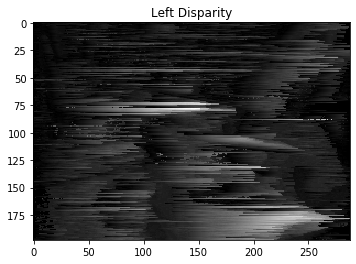

In [0]:
plt.subplot(111),plt.imshow(leftDisp, cmap = 'gray')
plt.title('Left Disparity'), plt.xticks(), plt.yticks()
plt.show()

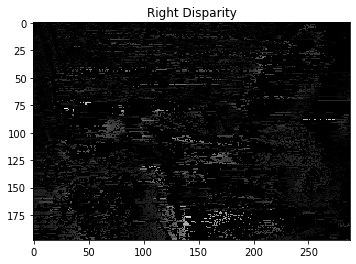

In [0]:
plt.subplot(111),plt.imshow(rightDisp, cmap = 'gray')
plt.title('Right Disparity'), plt.xticks(), plt.yticks()
plt.show()

In [0]:
final_points=np.array(final_points)
final_disp = np.array(final_disp)


In [0]:
final_disp.shape

In [0]:
y_d=[]

In [0]:
final_map=np.zeros(shape=(I_left_test.shape))

In [0]:
for i in range(0,final_disp.shape[0]):
  print("--------------------------------------")
  a=np.vstack((np.array(final_points[i])[:,1],np.array(final_disp[i])))
  y_d.append(a)
  print(a.shape)

In [0]:
for i in range(0,len(y_d)):
  a=y_d[i]
  a=a.reshape(-1,2)
  for j,d in a :
      final_map[i,j]=d



In [0]:
from google.colab.patches import cv2_imshow
cv2_imshow(final_map)

______

In [0]:
# Stereo Matching function as per the given paper
def stereoMatching(leftImg,rightImg):
    rows = leftImg.shape[0]
    cols = leftImg.shape[1]
    
    # Matrices to store disparities : left and right
    leftDisp=np.zeros((rows,cols))
    rightDisp=np.zeros((rows,cols))
     
    occ = 7
    
    # Pick a row in the image to be matched
    for c in range (0,rows):
        # Cost matrix 
        colMat=np.zeros((cols,cols))
        
        # Disparity path matrix
        dispMat=np.zeros((cols,cols))
        
        # Initialize the cost matrix 
        for i in range(0,cols):
            colMat[i][0] = i*occ
            colMat[0][i] = i*occ
        
        # Iterate the row in both the images to find the path using dynamic programming
        # Progamme is similar to LCS(Longest common subsequence)
        
        for k in range (0,cols):
            for j in range(0,cols):        
                if(leftImg[c][k]>rightImg[c][j]):
                    match_cost=leftImg[c][k]-rightImg[c][j]
                else:
                    match_cost=rightImg[c][j]-leftImg[c][k]
                
                # Finding minimum cost    
                min1=colMat[k-1][j-1]+match_cost
                min2=colMat[k-1][j]+occ
                min3=colMat[k][j-1]+occ
                
                colMat[k][j]=cmin=min(min1,min2,min3)
                
                # Marking the path 
                if(min1==cmin):
                    dispMat[k][j]=1
                if(min2==cmin):
                    dispMat[k][j]=2
                if(min3==cmin):
                    dispMat[k][j]=3
        
        # Iterate the matched path and update the disparity value
        i=cols-1
        j=cols-1
        
        while (i!=0) and  (j!=0):
            if(dispMat[i][j]==1):
                leftDisp[c][i]=np.absolute(i-j)
                rightDisp[c][j]=np.absolute(j-i)
                i=i-1
                j=j-1
            elif(dispMat[i][j]==2):

                leftDisp[c][i]=0
                i=i-1
            elif(dispMat[i][j]==3):
                rightDisp[c][j]=0
                leftDisp[c][j]=0
                j=j-1
                
    # Uncomment the following 2 lines code to write the left and right disparity images
    
    #cv2.imwrite("Left_Disparity_"+str(occ)+".png",leftDisp)
    #cv2.imwrite("Right_Disparity_"+str(occ)+".png",rightDisp)
    
    # Calculate MSE with respect to the ground truth values
    #mse(leftDisp,rightDisp,occ)
    
    # Uncomment the following code to display the left and right disparity images
        
    #plt.subplot(111),plt.imshow(leftDisp, cmap = 'gray')
    #plt.title('Left Disparity'), plt.xticks(), plt.yticks()
    return leftDisp,rightDisp


In [0]:
# Read images.
leftImg = cv2.imread("view1.png",0)
leftImg = np.asarray(leftImg, dtype=np.uint8) 
rightImg = cv2.imread("view2.png",0)
rightImg = np.asarray(rightImg, dtype=np.uint8)

# Call disparity matching algorithm
left, right = stereoMatching(leftImg,rightImg)


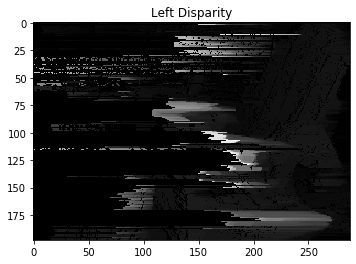

In [0]:
plt.subplot(111),plt.imshow(left, cmap = 'gray')
plt.title('Left Disparity'), plt.xticks(), plt.yticks()
plt.show()

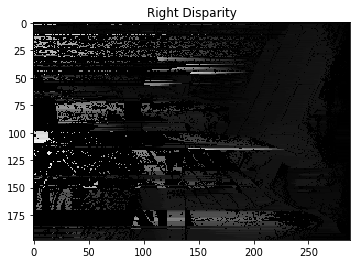

In [0]:
plt.subplot(111),plt.imshow(right, cmap = 'gray')
plt.title('Right Disparity'), plt.xticks(), plt.yticks()
plt.show()

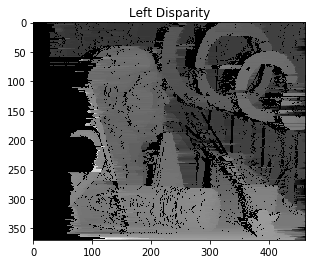

In [0]:
plt.subplot(111),plt.imshow(left, cmap = 'gray')
plt.title('Left Disparity'), plt.xticks(), plt.yticks()
plt.show()

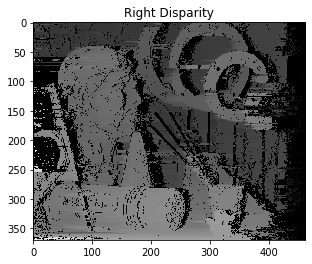

In [0]:
plt.subplot(111),plt.imshow(right, cmap = 'gray')
plt.title('Right Disparity'), plt.xticks(), plt.yticks()
plt.show()

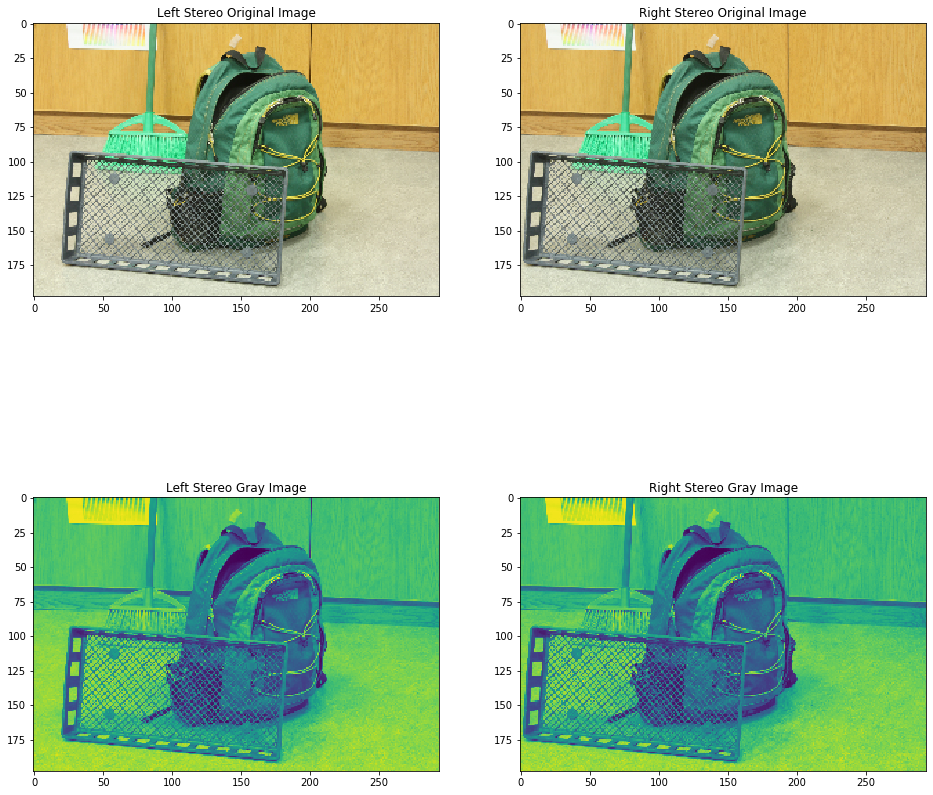

Calculating Disparity Cost Matrix................


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: overflow encountered in ubyte_scalars
  del sys.path[0]


Done with D calculations 
 Backtracking..............
visualizig changes of minimum selection in backtracking


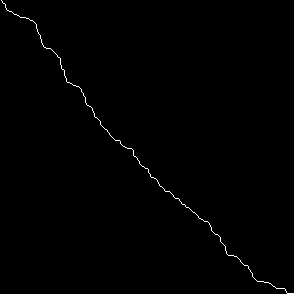

(198, 294)


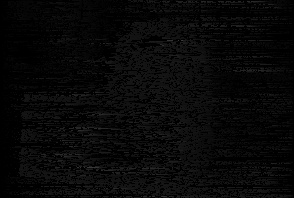

(198, 294)


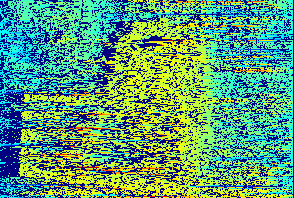

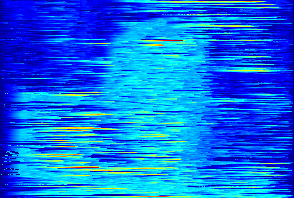

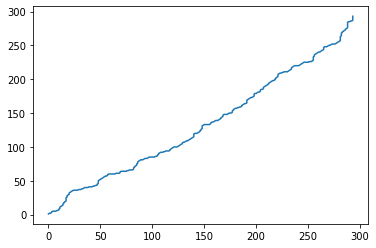

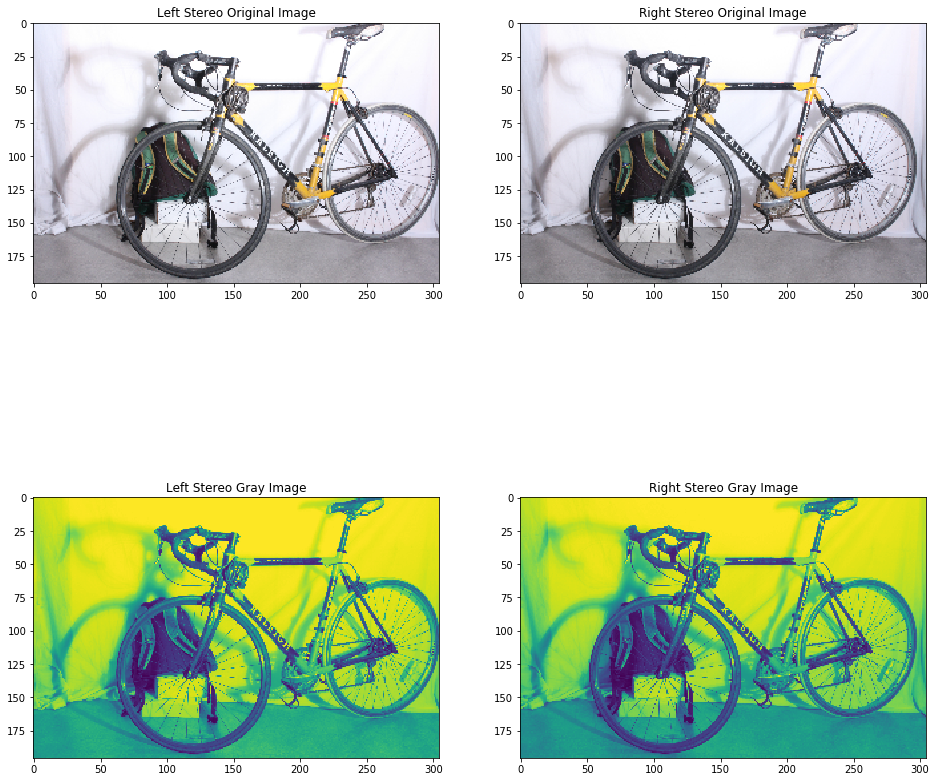

Calculating Disparity Cost Matrix................
Done with D calculations 
 Backtracking..............
visualizig changes of minimum selection in backtracking


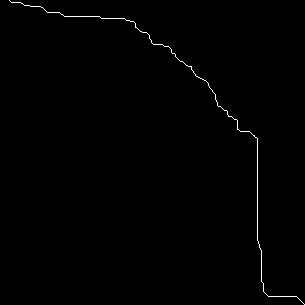

(196, 305)


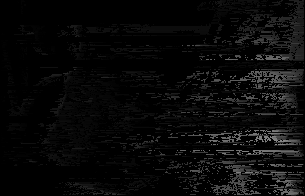

(196, 305)


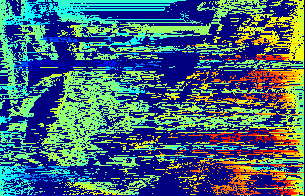

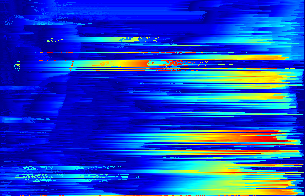

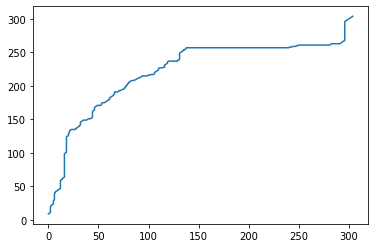

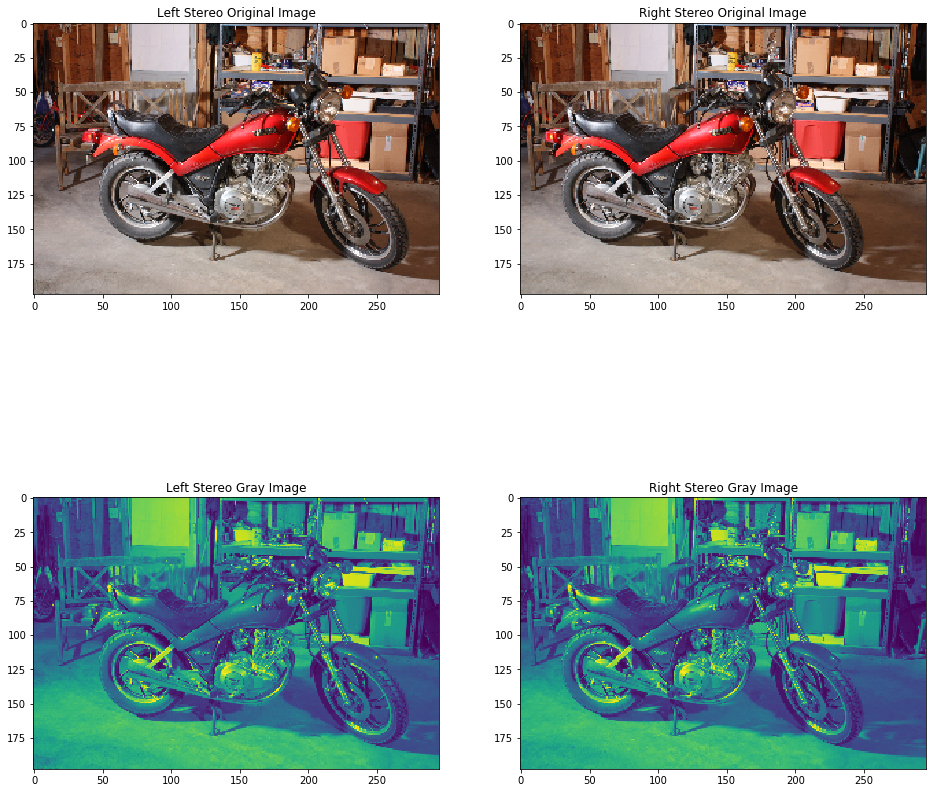

Calculating Disparity Cost Matrix................
Done with D calculations 
 Backtracking..............
visualizig changes of minimum selection in backtracking


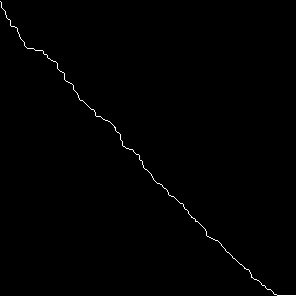

(198, 296)


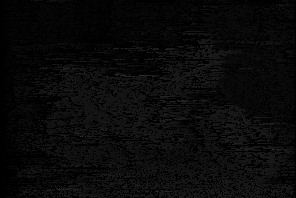

(198, 296)


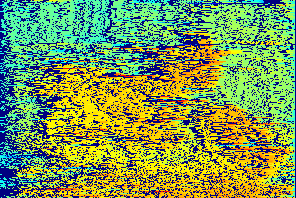

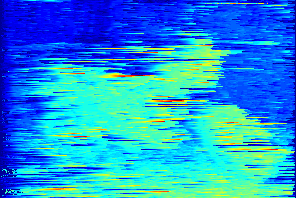

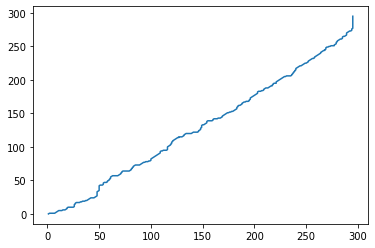

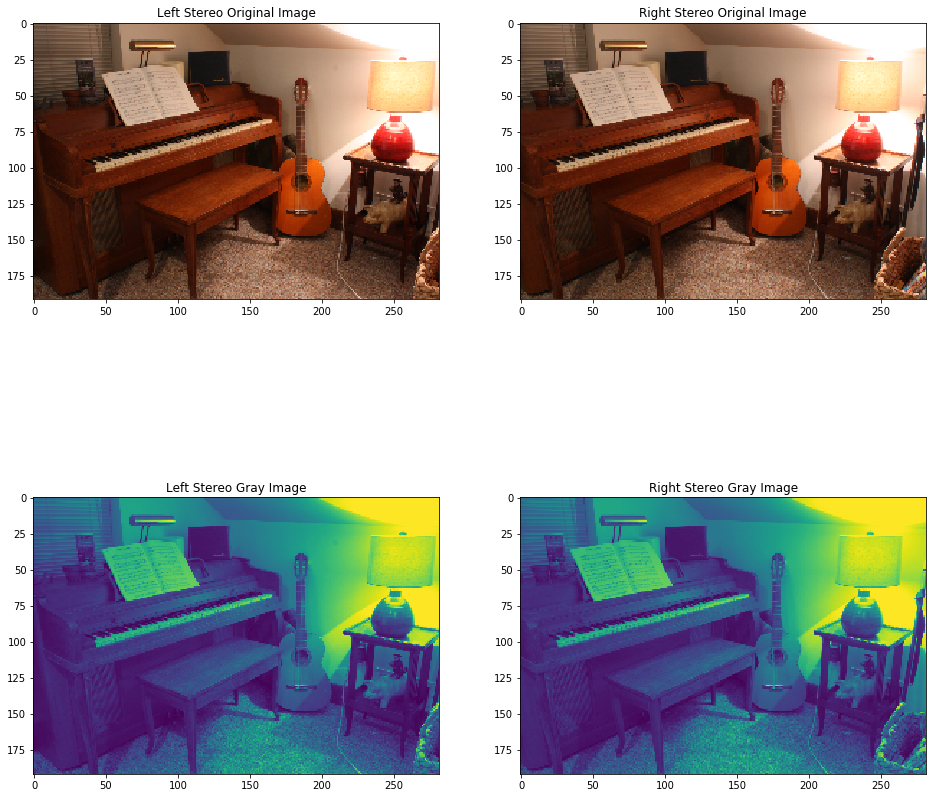

Calculating Disparity Cost Matrix................
Done with D calculations 
 Backtracking..............
visualizig changes of minimum selection in backtracking


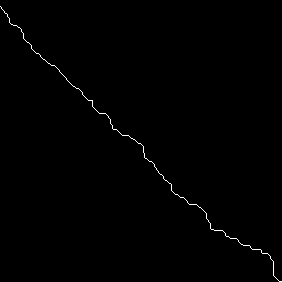

(192, 282)


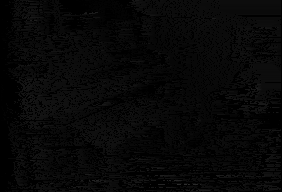

(192, 282)


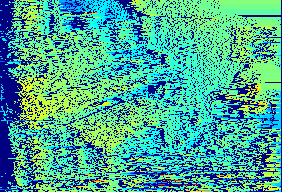

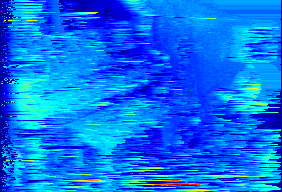

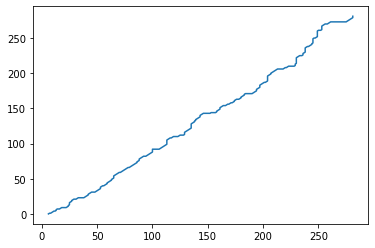

In [0]:
pictures_url = [["http://vision.middlebury.edu/stereo/data/scenes2014/datasets/Backpack-imperfect/im0.png","http://vision.middlebury.edu/stereo/data/scenes2014/datasets/Backpack-imperfect/im1.png"],
                ["http://vision.middlebury.edu/stereo/data/scenes2014/datasets/Bicycle1-imperfect/im0.png","http://vision.middlebury.edu/stereo/data/scenes2014/datasets/Bicycle1-imperfect/im1.png"],
                ["http://vision.middlebury.edu/stereo/data/scenes2014/datasets/Motorcycle-imperfect/im0.png","http://vision.middlebury.edu/stereo/data/scenes2014/datasets/Motorcycle-imperfect/im1.png"],
                ["http://vision.middlebury.edu/stereo/data/scenes2014/datasets/Piano-imperfect/im0.png","http://vision.middlebury.edu/stereo/data/scenes2014/datasets/Piano-imperfect/im1.png"]
                ]
compression_ratio = 10
for left_img_url,right_img_url in pictures_url:
  I_left = io.imread(left_img_url)
  I_left = cv2.resize(I_left,(I_left.shape[1]//compression_ratio,I_left.shape[0]//compression_ratio))
  I_Right = io.imread(right_img_url)
  fig = plt.figure(figsize=(16, 16))
  I_Right = cv2.resize(I_Right,(I_Right.shape[1]//compression_ratio,I_Right.shape[0]//compression_ratio))
  fig.add_subplot(2, 2, 1).set_title("Left Stereo Original Image");plt.imshow(I_left);fig.add_subplot(2, 2, 2).set_title("Right Stereo Original Image");plt.imshow(I_Right)

  # StereoBM works on gray images
  I_left = cv2.cvtColor(I_left, cv2.COLOR_RGB2GRAY)
  fig.add_subplot(2, 2, 3).set_title("Left Stereo Gray Image");plt.imshow(I_left)

  I_Right = cv2.cvtColor(I_Right, cv2.COLOR_RGB2GRAY)
  fig.add_subplot(2, 2, 4).set_title("Right Stereo Gray Image");plt.imshow(I_Right);plt.show()

  Display_Stereo(I_left,I_Right)
